In [1]:
import numpy as np
import pandas as pd
import os 
import matplotlib.pyplot as plt
import umap
import seaborn as sns

from dredFISH.Utils import __init__plots
from dredFISH.Utils import basicu

In [2]:
# pth_dat = '/bigstore/GeneralStorage/fangming/projects/visctx/data_dump/easifish_aug1'
pth_dat = '/bigstore/GeneralStorage/fangming/projects/visctx/data_dump/aug5-v2'
!ls $pth_dat

bad_roi_list.npy  roi_all.csv  spotcount_dense_spot_corrected.csv
organized_v2.csv  roi.csv      spots.csv


In [3]:
gene_names = {
    'r1_c0': 'Sorcs3',
    'r1_c1': 'Kcnq5',
    'r1_c2': 'Chrm2',
    'r1_c4': 'Adamts2',
    
    'r2_c0': 'Kcnip3',
    'r2_c1': 'Rorb',
    'r2_c2': 'Cdh13',
    'r2_c4': 'Cntn5',
}

ftrs_order = [
    'r1_c4', # a 
    'r2_c2', # a
    'r2_c4', # a, L4
    
    'r1_c0', # b
    
    'r1_c1', # c
    
    'r1_c2', # c, L4
    
    'r2_c1', # L4
    'r2_c0', # L4

]
genes_order = [gene_names[ftr] for ftr in ftrs_order]
genes_order

['Adamts2', 'Cdh13', 'Cntn5', 'Sorcs3', 'Kcnq5', 'Chrm2', 'Rorb', 'Kcnip3']

In [4]:
# f_meta2 = os.path.join(pth_dat, 'roi_all.csv')
f_meta = os.path.join(pth_dat, 'roi.csv')
f_ftrs = os.path.join(pth_dat, 'spotcount_dense_spot_corrected.csv')
f_badroi = os.path.join(pth_dat, 'bad_roi_list.npy')

In [5]:
badroi = np.load(f_badroi)
badroi.shape, badroi[:5]

((891,), array([ 32,  52,  57,  61, 115], dtype=int32))

In [6]:
meta = pd.read_csv(f_meta, index_col=0)
meta

,z,y,x,area
roi,,,,
1,363.489055,17.368291,73.106487,102.469416
2,125.553784,51.560521,396.296073,1692.922728
3,111.095382,104.351716,254.707325,1133.917848
4,55.515114,52.433029,164.453027,1471.898064
5,324.728038,91.253685,221.069806,1436.260392
...,...,...,...,...
13754,206.419432,212.102989,10.116867,234.888696
13755,252.961215,197.694189,313.463300,412.632696
13756,265.635180,65.784569,393.811699,170.012136


In [7]:
ftrs = pd.read_csv(f_ftrs, index_col=0)
ftrs

,r1_c0,r1_c1,r1_c2,r1_c4,r2_c0,r2_c1,r2_c2,r2_c4
1,159.088134,1.696923,128.996454,28.162674,0.0,1.0,0.0,0.0
2,4.000000,13.000000,0.000000,0.000000,0.0,2.0,2.0,1.0
3,5.000000,20.000000,0.000000,1.000000,2.0,5.0,0.0,0.0
4,3.000000,14.000000,0.000000,2.000000,0.0,4.0,0.0,1.0
5,5.000000,23.000000,0.000000,4.000000,14.0,12.0,0.0,2.0
...,...,...,...,...,...,...,...,...
13754,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0
13755,0.000000,2.000000,0.000000,1.000000,0.0,2.0,0.0,0.0
13756,0.000000,0.000000,0.000000,1.000000,3.0,4.0,0.0,0.0
13757,0.000000,0.000000,0.000000,2.000000,0.0,0.0,0.0,0.0


In [8]:
df = ftrs.join(meta).dropna()
ftrs_cols = ftrs.columns.values
print(meta.shape, ftrs.shape, df.shape)
df

(12867, 4) (13758, 8) (12867, 12)


,r1_c0,r1_c1,r1_c2,r1_c4,r2_c0,r2_c1,r2_c2,r2_c4,z,y,x,area
1,159.088134,1.696923,128.996454,28.162674,0.0,1.0,0.0,0.0,363.489055,17.368291,73.106487,102.469416
2,4.000000,13.000000,0.000000,0.000000,0.0,2.0,2.0,1.0,125.553784,51.560521,396.296073,1692.922728
3,5.000000,20.000000,0.000000,1.000000,2.0,5.0,0.0,0.0,111.095382,104.351716,254.707325,1133.917848
4,3.000000,14.000000,0.000000,2.000000,0.0,4.0,0.0,1.0,55.515114,52.433029,164.453027,1471.898064
5,5.000000,23.000000,0.000000,4.000000,14.0,12.0,0.0,2.0,324.728038,91.253685,221.069806,1436.260392
...,...,...,...,...,...,...,...,...,...,...,...,...
13754,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,206.419432,212.102989,10.116867,234.888696
13755,0.000000,2.000000,0.000000,1.000000,0.0,2.0,0.0,0.0,252.961215,197.694189,313.463300,412.632696
13756,0.000000,0.000000,0.000000,1.000000,3.0,4.0,0.0,0.0,265.635180,65.784569,393.811699,170.012136
13757,0.000000,0.000000,0.000000,2.000000,0.0,0.0,0.0,0.0,193.609296,72.832144,206.992864,160.413960


In [9]:
max_x, max_y, max_z = df[['x', 'y', 'z']].describe().loc['max']
min_x, min_y, min_z = df[['x', 'y', 'z']].describe().loc['min']

df['to_edge'] = np.minimum(
    np.minimum(df['x']-min_x, max_x-df['x']), 
    np.minimum(df['y']-min_y, max_y-df['y']), 
    np.minimum(df['z']-min_z, max_z-df['z']),
)

In [10]:
ftrs_cols

array(['r1_c0', 'r1_c1', 'r1_c2', 'r1_c4', 'r2_c0', 'r2_c1', 'r2_c2',
       'r2_c4'], dtype=object)

In [11]:
for col in ftrs_cols:
    val = df[col].values
    print(np.min(val), np.max(val), np.sum(val>0))

0.0 245.4719243062117 9265
0.0 593.2748580003694 12206
0.0 183.07041513345325 6347
0.0 46.0 5127
0.0 92.0 6174
0.0 177.0 10366
0.0 78.0 4131
0.0 32.0 3912


# check basics
- unit (um?) 2x expanded?
- y: dorsal ventral (layers in cortex)
- x: lateral medial?
- z:

In [12]:
x = df['x'].values
y = df['y'].values
z = df['z'].values

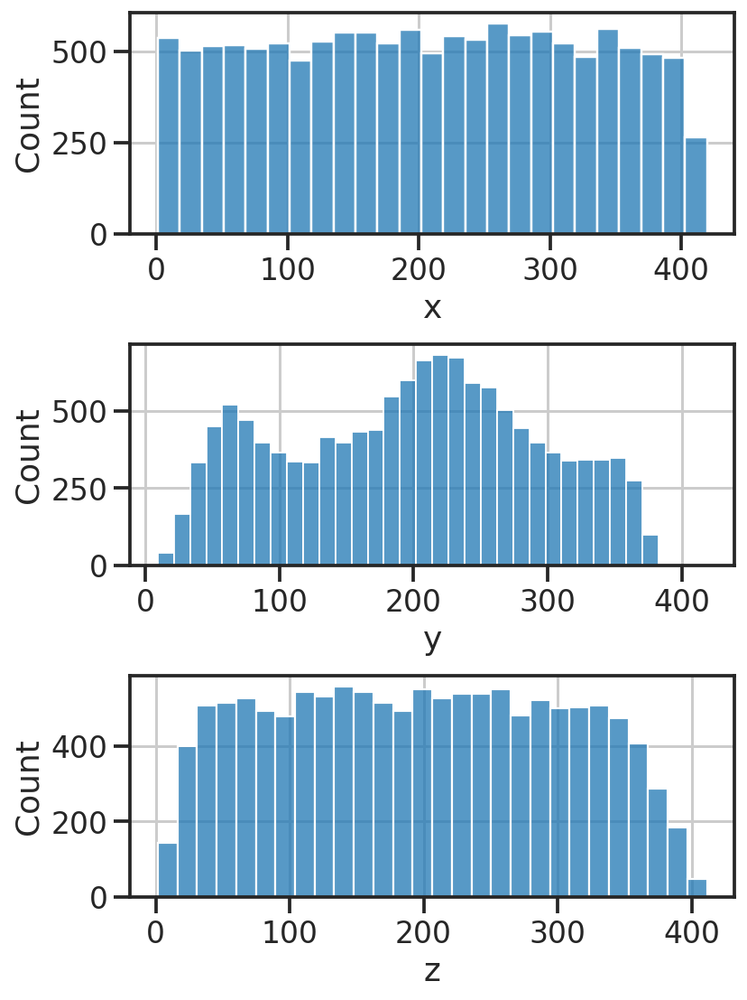

In [13]:
fig, axs = plt.subplots(3, 1, figsize=(1*6, 3*3))
ax = axs[0]
sns.histplot(x, ax=ax)
ax.set_xlabel('x')

ax = axs[1]
sns.histplot(y, ax=ax)
ax.set_xlabel('y')

ax = axs[2]
sns.histplot(z, ax=ax)
ax.set_xlabel('z')

fig.subplots_adjust(hspace=0.5)
plt.show()

Text(0.5, 0, 'area')

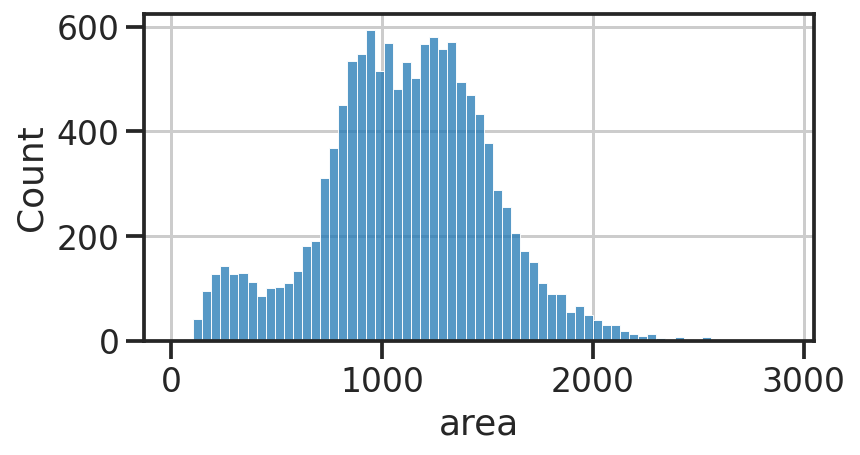

In [14]:
# fig, axs = plt.subplots(8, 1, figsize=(1*6, 8*3))
# for i, col in enumerate(ftrs_cols):
#     ax = axs[i]
#     val = df[col].values 
#     bins = np.linspace(0, np.max(val), 50)
#     sns.histplot(val, ax=ax, bins=bins)
#     ax.set_xlabel(col)
# plt.show()
fig, ax = plt.subplots(1, 1, figsize=(1*6, 1*3))
sns.histplot(df['area'].values, ax=ax)
ax.set_xlabel('area')

Text(0.5, 0, 'Genes')

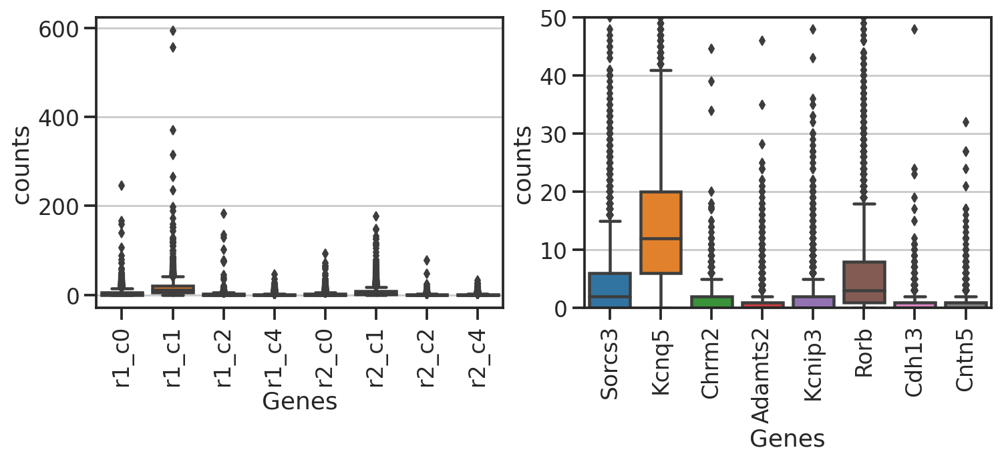

In [15]:
fig, axs = plt.subplots(1, 2, figsize=(6*2,4))
ax = axs[0]
sns.boxplot(data=df[ftrs_cols], ax=ax)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
ax.set_ylabel('counts')
ax.set_xlabel('Genes')

ax = axs[1]
sns.boxplot(data=df[ftrs_cols], ax=ax)
ax.set_xticklabels([gene_names[ftr_col] for ftr_col in ftrs_cols], rotation=90)
ax.set_ylim([0,50])
ax.set_ylabel('counts')
ax.set_xlabel('Genes')

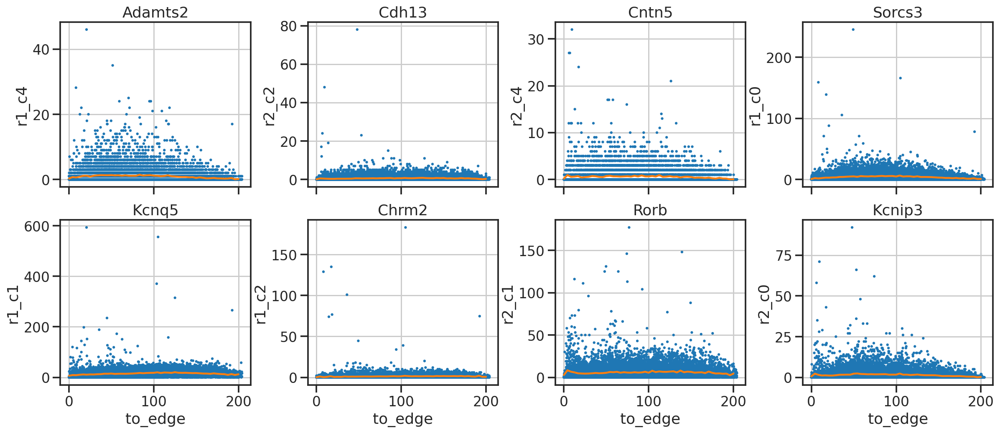

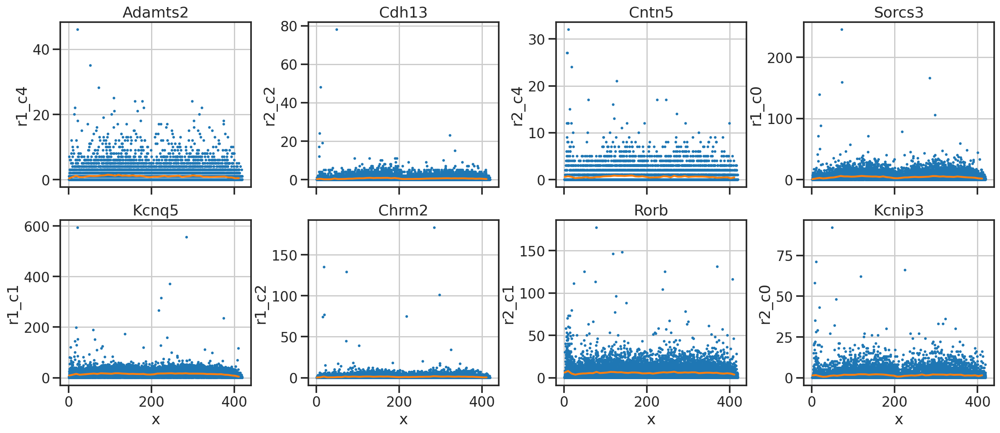

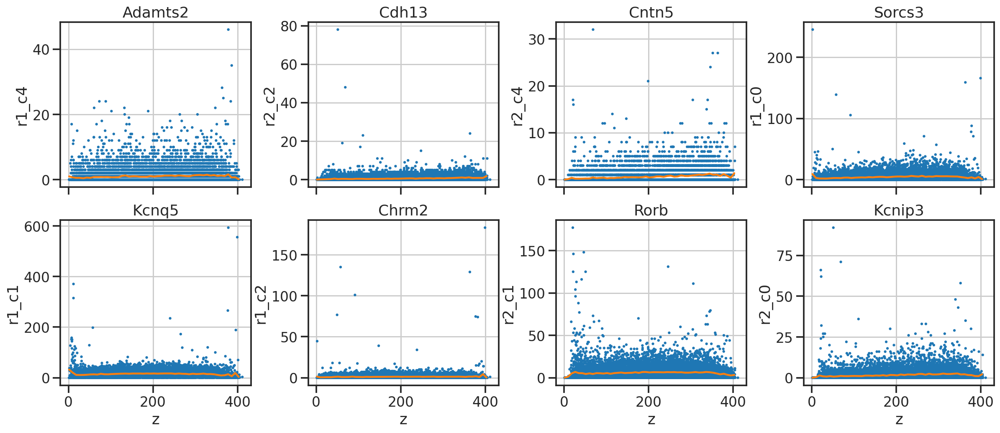

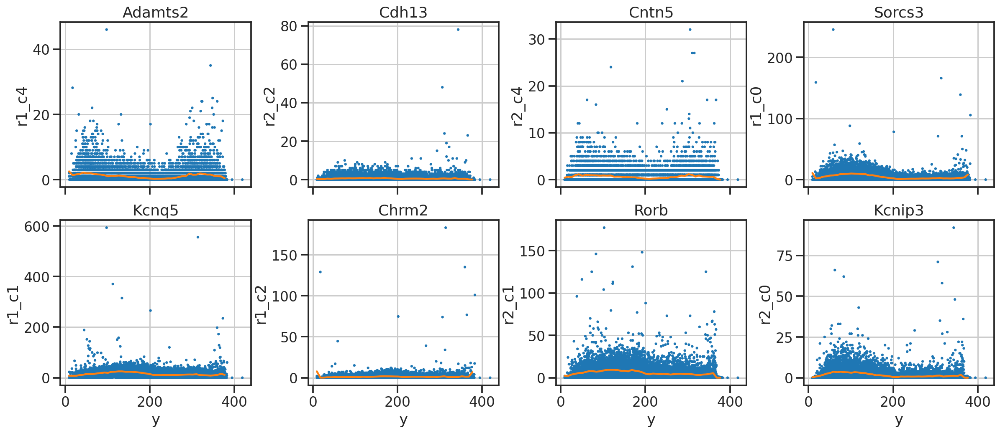

In [19]:
for sp_col in ['to_edge', 'x', 'z', 'y']:
    # sp_col = 'x'
    val = df[sp_col]
    bins = np.linspace(np.min(val), np.max(val), 50)
    dfplot = df.copy()
    dfplot['bin'] = pd.cut(val, bins=bins)
    dfplot = dfplot.groupby('bin').mean()

    fig, axs = plt.subplots(2,4,figsize=(5*4,4*2), sharex=True)
    for i, (col, ax) in enumerate(zip(ftrs_order, axs.flat)):
        sns.scatterplot(data=df, y=col, x=sp_col, 
                        edgecolor='none', s=10, ax=ax)
        ax.plot(bins[:-1], dfplot[col].values, color='C1')
        ax.set_title(gene_names[col])
    fig.subplots_adjust(hspace=0.2, wspace=0.3)

# outliers

In [21]:
# cond_otlr = np.zeros(len(df), dtype=int)
# for col in ftrs_cols:
#     cond_otlr += (df[col] > 200).values
# cond_otlr = cond_otlr>0
# print(np.sum(cond_otlr))

# # df.loc[cond_otlr] #.shape
# dfsub = df.loc[~cond_otlr]
# dfsub

dfsub = df.copy()

# features 

In [22]:
# remove outlier cells
# normalize 
# single-cell analysis
# PCA
# Can we get A,B,C types?
# map it onto tissues (spatial distribution of cells)

In [102]:
# condz = np.logical_and(dfsub['area'] > 500,  dfsub['z'] < 300)
# condx = np.logical_and(dfsub['x'] > 100, dfsub['x'] < 300)
# cond_all = np.logical_and(condz, condx)

# remove small size
conds = [
    dfsub['area'] > 500,
    dfsub['x'] > min_x + 10,
    dfsub['x'] < max_x - 10,
    
    dfsub['y'] > min_y + 10,
    dfsub['y'] < max_y - 10,
    
    dfsub['z'] > min_z + 10,
    dfsub['z'] < max_z - 10,
]
cond_all = np.ones(len(dfsub)) > 0
for cond in conds:
    cond_all = np.logical_and(cond_all, cond)
print(len(dfsub), cond_all.sum())

dfnew = dfsub[cond_all].copy()

# size
med_size = dfnew['area'].median()
print(med_size)
size_factor = dfnew['area']/med_size

# norm by size
dfnew[ftrs_cols] = dfnew[ftrs_cols].divide(size_factor, axis=0)
# log2+1 norm
dfnew[np.char.add(ftrs_cols.astype(str) ,'_log2')] = np.log2(dfnew[ftrs_cols]+1)

    
dfnew.shape

12867 11437
1168.22244


(11437, 21)

Text(0.5, 0, 'size/median_size')

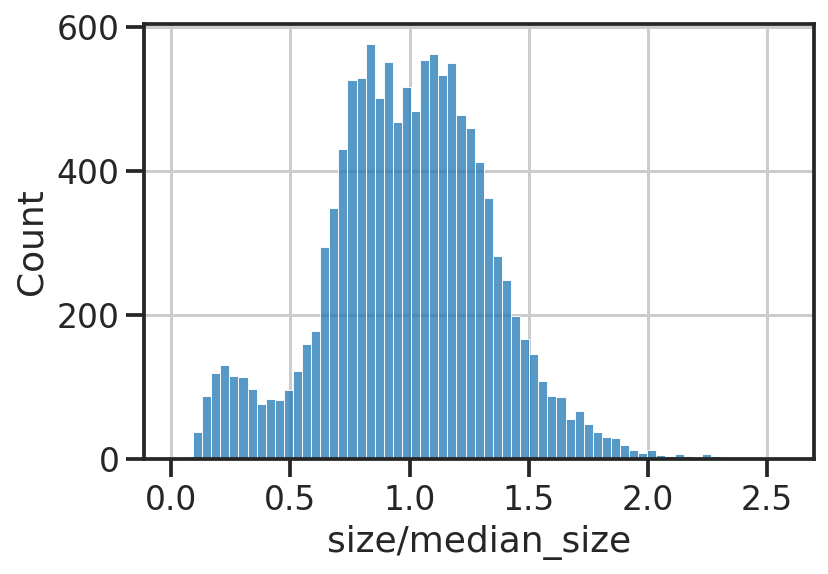

In [70]:
sns.histplot(size_factor)
plt.xlabel('size/median_size')

Text(0, 0.5, 'log2(counts+1)')

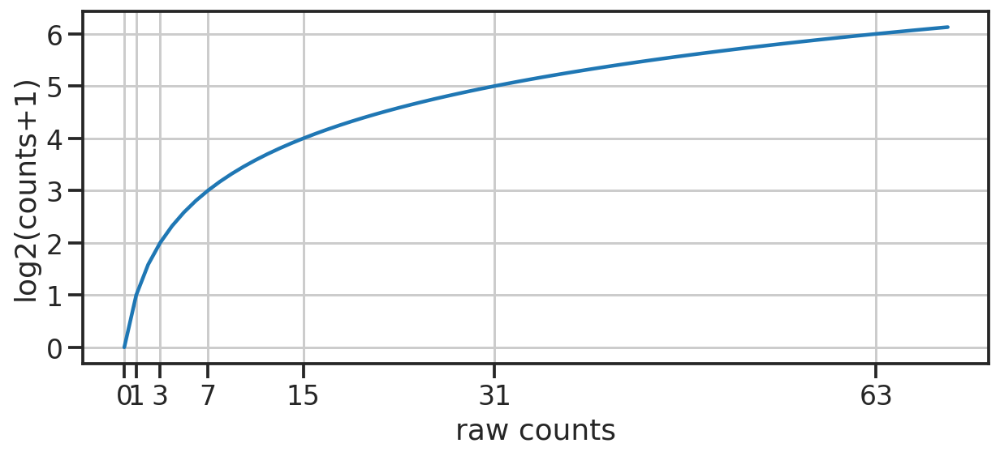

In [71]:
x = np.arange(0, 70)
y = np.log2(x+1)
plt.figure(figsize=(10,4))
plt.plot(x, y)
plt.yticks(np.arange(7))
plt.xticks(np.power(2, np.arange(7))-1) #np.arange(0, 51, 10))
plt.xlabel('raw counts')
plt.ylabel('log2(counts+1)')

In [72]:
mat_raw = dfnew[ftrs_cols].values
mat = (mat_raw - np.mean(mat_raw, axis=0))/np.std(mat_raw, axis=0)

In [73]:
from sklearn.decomposition import PCA
pca = PCA(n_components=8)
pc = pca.fit_transform(mat)
pca.explained_variance_ratio_

array([0.35389372, 0.14093867, 0.12985592, 0.10083322, 0.09610322,
       0.07454855, 0.06195542, 0.04187128])

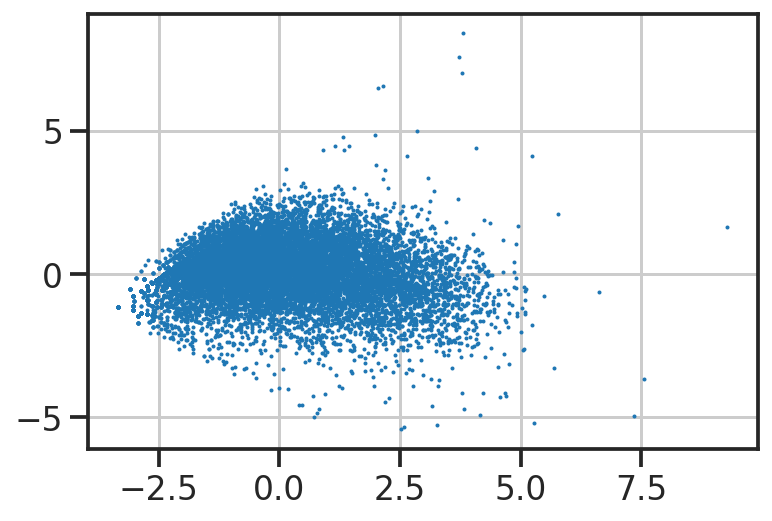

In [74]:
plt.plot(pc[:,0], 
         pc[:,1],
         'o', markersize=1,
        )

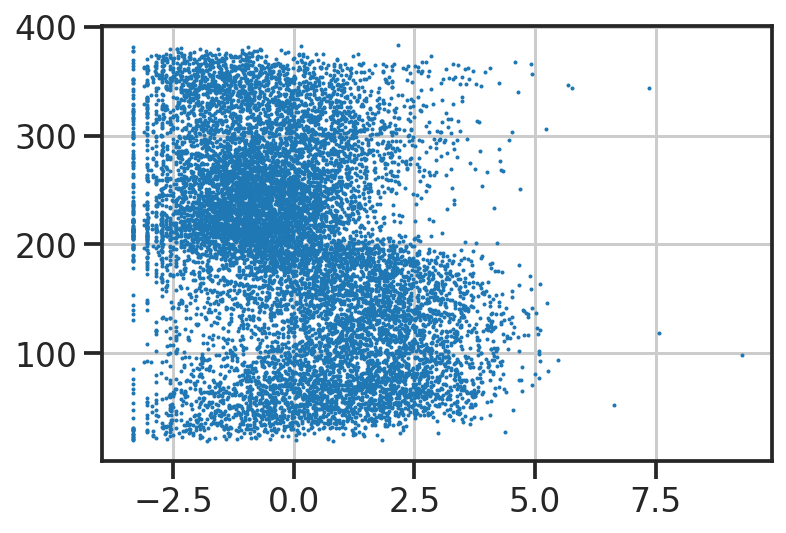

In [75]:
plt.plot(pc[:,0], 
         dfnew['y'].values,
         'o', markersize=1,
        )

# genes

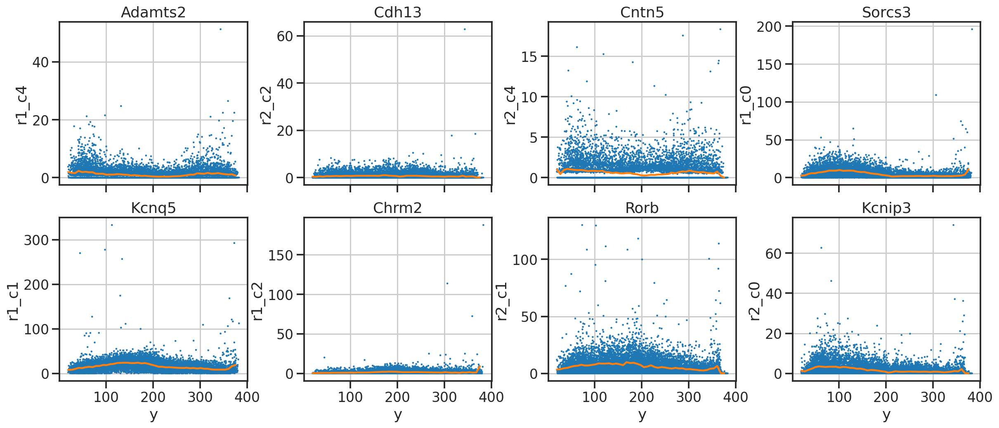

In [103]:
sp_col = 'y'
val = dfnew[sp_col]
bins = np.linspace(np.min(val), np.max(val), 50)
dfplot = dfnew.copy()
dfplot['bin'] = pd.cut(val, bins=bins)
dfplot = dfplot.groupby('bin').mean()

fig, axs = plt.subplots(2,4,figsize=(5*4,4*2), sharex=True)
for i, (col, ax) in enumerate(zip(ftrs_order, axs.flat)):
    sns.scatterplot(data=dfnew, y=col, x=sp_col, 
                    edgecolor='none', s=5, ax=ax)
    ax.plot(bins[:-1], dfplot[col].values, color='C1')
    ax.set_title(gene_names[col])
fig.subplots_adjust(hspace=0.2, wspace=0.3)

/tmp/ipykernel_3268318/1614015042.py:24: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(g, ax=ax, label='log2 normed')


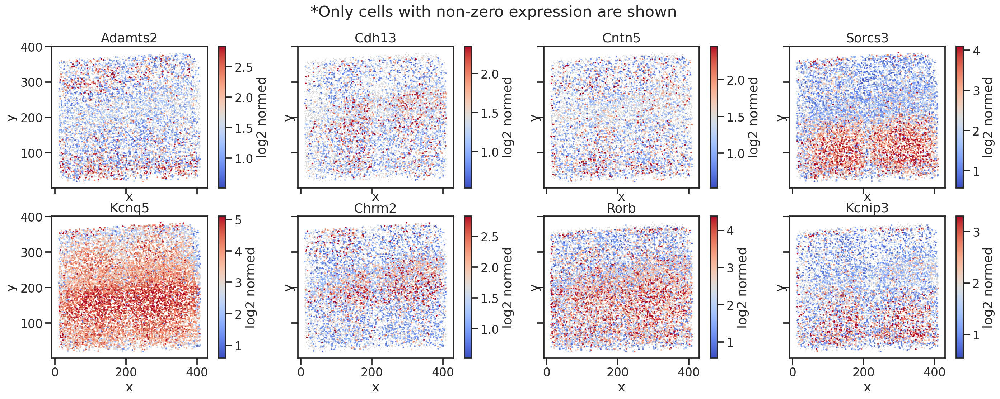

In [125]:
sp_x, sp_y = 'x', 'y'
fig, axs = plt.subplots(2,4,figsize=(6*4,4*2), sharey=True, sharex=True)
for i, (col, ax) in enumerate(zip(ftrs_order, axs.flat)):
    col = col+'_log2'
    x = dfnew[sp_x].values
    y = dfnew[sp_y].values
    c = dfnew[col].values
    cond = c>0
    ax.scatter(x[~cond], y[~cond], s=1, edgecolor='none', color='lightgray')
    
    x = x[cond]
    y = y[cond]
    c = c[cond]
    vmax=np.percentile(c, 95)
    
    
    g = ax.scatter(x, y, c=c, s=5, edgecolor='none', cmap='coolwarm', vmax=vmax)
    ax.set_title(gene_names[col.replace('_log2', '')])
    ax.set_xlabel(sp_x)
    ax.set_ylabel(sp_y)
    ax.set_aspect('equal')
    ax.grid(False)
    
    fig.colorbar(g, ax=ax, label='log2 normed')
fig.suptitle('*Only cells with non-zero expression are shown')
fig.subplots_adjust(hspace=0.2, wspace=0.1)

/tmp/ipykernel_3268318/1467027096.py:23: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(g, ax=ax, label='log2 normed')


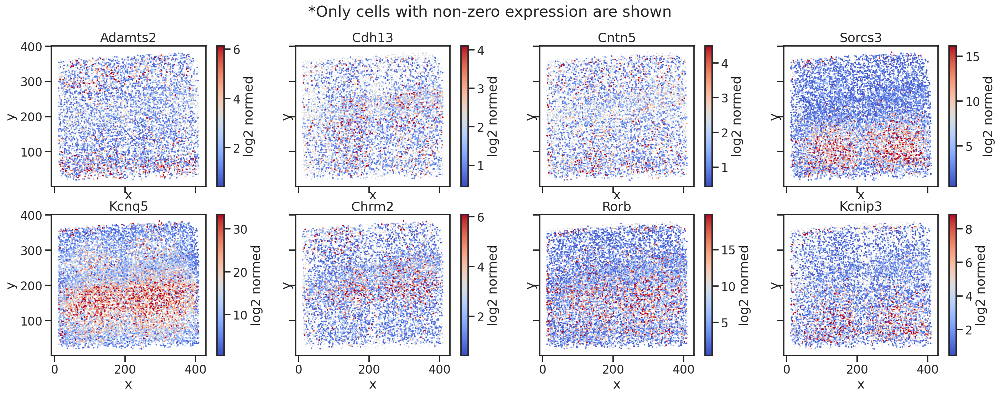

In [127]:
sp_x, sp_y = 'x', 'y'
fig, axs = plt.subplots(2,4,figsize=(6*4,4*2), sharey=True, sharex=True)
for i, (col, ax) in enumerate(zip(ftrs_order, axs.flat)):
    x = dfnew[sp_x].values
    y = dfnew[sp_y].values
    c = dfnew[col].values
    cond = c>0
    ax.scatter(x[~cond], y[~cond], s=1, edgecolor='none', color='lightgray')
    
    x = x[cond]
    y = y[cond]
    c = c[cond]
    vmax=np.percentile(c, 95)
    
    
    g = ax.scatter(x, y, c=c, s=5, edgecolor='none', cmap='coolwarm', vmax=vmax)
    ax.set_title(gene_names[col.replace('_log2', '')])
    ax.set_xlabel(sp_x)
    ax.set_ylabel(sp_y)
    ax.set_aspect('equal')
    ax.grid(False)
    
    fig.colorbar(g, ax=ax, label='log2 normed')
fig.suptitle('*Only cells with non-zero expression are shown')
fig.subplots_adjust(hspace=0.2, wspace=0.1)

/tmp/ipykernel_3268318/1558580440.py:23: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
  fig.colorbar(g, ax=ax, label='log2 normed')


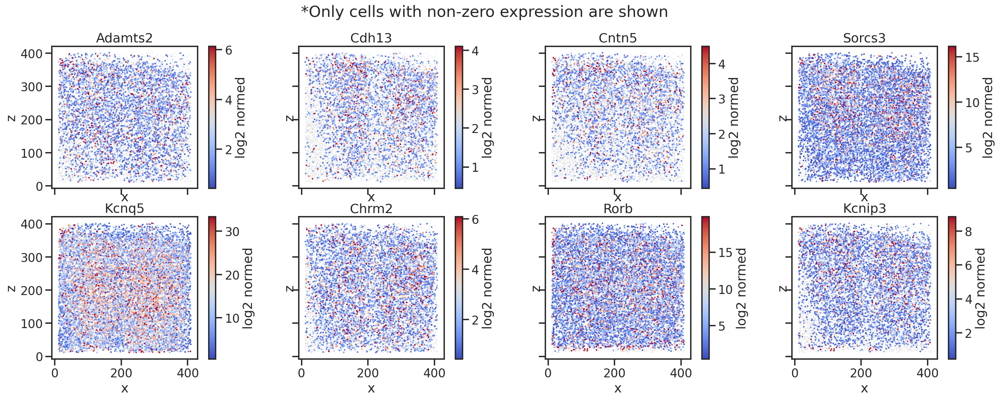

In [124]:
sp_x, sp_y = 'x', 'z'
fig, axs = plt.subplots(2,4,figsize=(6*4,4*2), sharey=True, sharex=True)
for i, (col, ax) in enumerate(zip(ftrs_order, axs.flat)):
    x = dfnew[sp_x].values
    y = dfnew[sp_y].values
    c = dfnew[col].values
    cond = c>0
    ax.scatter(x[~cond], y[~cond], s=1, edgecolor='none', color='lightgray')
    
    x = x[cond]
    y = y[cond]
    c = c[cond]
    vmax=np.percentile(c, 95)
    
    
    g = ax.scatter(x, y, c=c, s=5, edgecolor='none', cmap='coolwarm', vmax=vmax)
    ax.set_title(gene_names[col])
    ax.set_xlabel(sp_x)
    ax.set_ylabel(sp_y)
    ax.set_aspect('equal')
    ax.grid(False)
    
    fig.colorbar(g, ax=ax, label='log2 normed')
fig.suptitle('*Only cells with non-zero expression are shown')
fig.subplots_adjust(hspace=0.2, wspace=0.1)

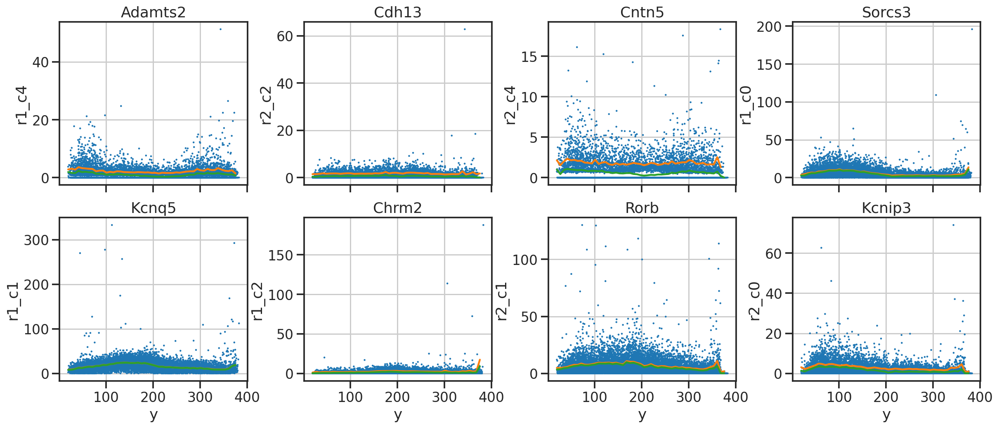

In [107]:
sp_col = 'y' 
val = dfnew[sp_col]
bins = np.linspace(np.min(val), np.max(val), 50)
dfplot = dfnew.copy()
dfplot['bin'] = pd.cut(val, bins=bins)
dfplotmean = dfplot.groupby('bin').mean()

fig, axs = plt.subplots(2,4,figsize=(5*4,4*2), sharex=True)
for i, (col, ax) in enumerate(zip(ftrs_order, axs.flat)):

    dfplotsub = dfplot[dfplot[col]>0] 
    dfplotsub = dfplotsub.groupby('bin').mean()

    sns.scatterplot(data=dfnew, y=col, x=sp_col, 
                    edgecolor='none', s=5, ax=ax)

    ax.plot(bins[:-1], dfplotsub[col].values, color='C1')
    ax.plot(bins[:-1], dfplotmean[col].values, color='C2')

    ax.set_title(gene_names[col])
fig.subplots_adjust(hspace=0.2, wspace=0.3)

# combine y-axis histograms
- cell size
- cell density
- 8 genes

In [108]:
val = df['y'].values
bins = np.linspace(np.min(val), np.max(val), 50)

dfplot = df.copy()
dfplot['bin'] = pd.cut(val, bins=bins)
dfplot_binmean = dfplot.groupby('bin').mean()
dfplot_binmean['num'] = dfplot.groupby('bin').size()

In [109]:
val = dfnew['y'].values
bins = np.linspace(np.min(val), np.max(val), 50)

dfplot = dfnew.copy()
dfplot['bin'] = pd.cut(val, bins=bins)
dfplot_binmean2 = dfplot.groupby('bin').mean()
dfplot_binmean2['num'] = dfplot.groupby('bin').size()

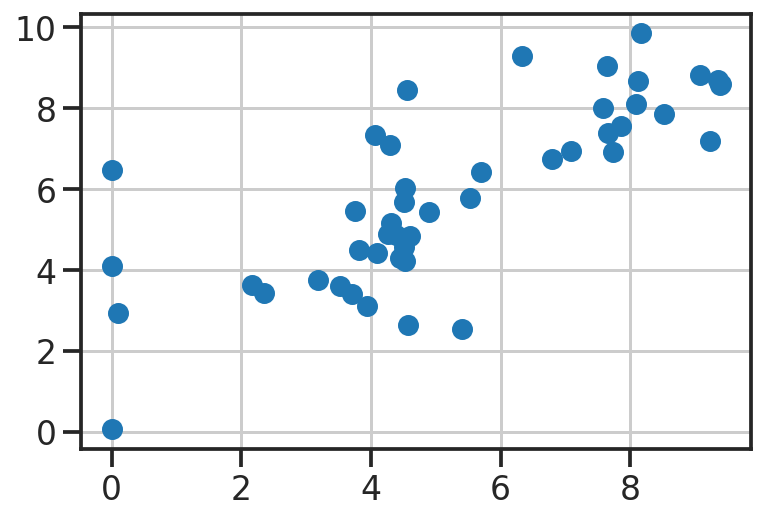

In [110]:
plt.scatter(dfplot_binmean['r2_c1'].values, 
            dfplot_binmean2['r2_c1'].values)

In [111]:
df['r2_c1']

1         1.0
2         2.0
3         5.0
4         4.0
5        12.0
         ... 
13754     0.0
13755     2.0
13756     4.0
13757     0.0
13758     0.0
Name: r2_c1, Length: 12867, dtype: float64

In [112]:
dfnew['r2_c1']

2         1.380125
3         5.151266
4         3.174737
5         9.760535
6         0.000000
           ...    
13649     0.000000
13685     4.515630
13694    10.751928
13697     4.744916
13733     1.430982
Name: r2_c1, Length: 11437, dtype: float64

In [113]:
val = df['y'].values
bins = np.linspace(np.min(val), np.max(val), 50)

dfplot = df.copy()
dfplot['bin'] = pd.cut(val, bins=bins)
dfplot_binmean = dfplot.groupby('bin').mean()
dfplot_binmean['num'] = dfplot.groupby('bin').size()

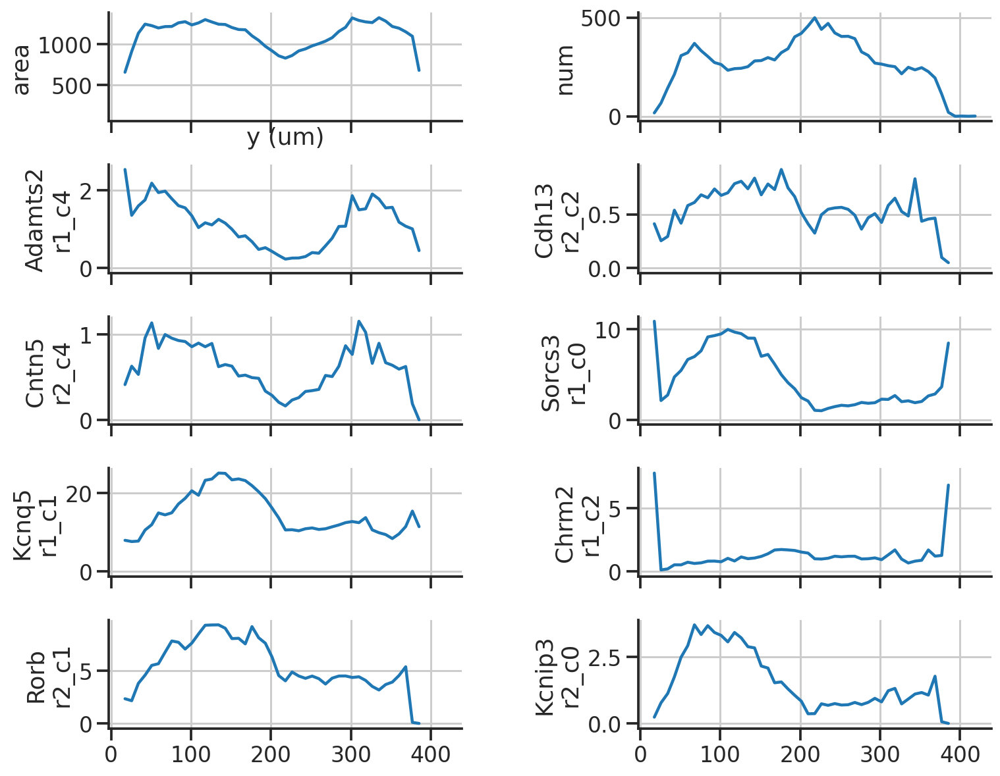

In [114]:
cols = dfplot_binmean.columns
cols = ['to_edge', 'area', 'num', 'x', 'z']
cols = ['area', 'num',]
cols = np.hstack([
    ['area', 'num',],
    ftrs_order,
])
n = len(cols)
nx = 2
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny,nx,figsize=(6*nx,2*ny), sharex=True)
for i, (col, ax) in enumerate(zip(cols, axs.flat)):
    val = dfplot_binmean[col].values
    # val = val/np.nanmax(val)
    # print(val)
    ax.plot(bins[1:], val, label=col)
    ax.set_ylabel(col)
    if col.startswith('r'):
        ax.set_ylabel(gene_names[col] + "\n" + col)
    sns.despine(ax=ax)
    if i == 0:
        ax.set_xlabel('y (um)')
    
fig.subplots_adjust(wspace=0.5, hspace=0.4)
# ax.legend(bbox_to_anchor=(1,1))
plt.show()

In [115]:
val = dfnew['y'].values
bins = np.linspace(np.min(val), np.max(val), 50)

dfplot = dfnew.copy()
dfplot['bin'] = pd.cut(val, bins=bins)
dfplot_binmean = dfplot.groupby('bin').mean()
dfplot_binmean['num'] = dfplot.groupby('bin').size()

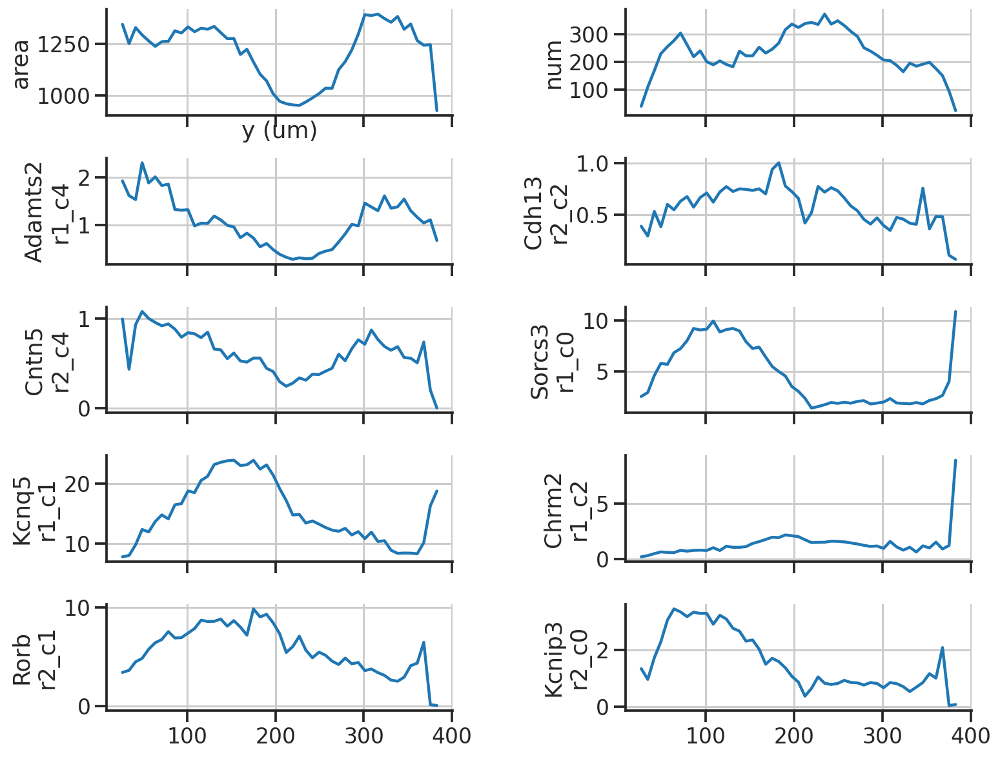

In [116]:
# cols = dfplot_binmean.columns
# cols = ['to_edge', 'area', 'num', 'x', 'z']
# cols = ['area', 'num',]
cols = np.hstack([
    ['area', 'num',],
    ftrs_order,
])
n = len(cols)
nx = 2
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny,nx,figsize=(6*nx,2*ny), sharex=True)
for i, (col, ax) in enumerate(zip(cols, axs.flat)):
    val = dfplot_binmean[col].values
    # val = val/np.nanmax(val)
    # print(val)
    ax.plot(bins[1:], val, label=col)
    ax.set_ylabel(col)
    if col.startswith('r'):
        ax.set_ylabel(gene_names[col] + "\n" + col)
    sns.despine(ax=ax)
    if i == 0:
        ax.set_xlabel('y (um)')
    
fig.subplots_adjust(wspace=0.5, hspace=0.4)
# ax.legend(bbox_to_anchor=(1,1))
plt.show()

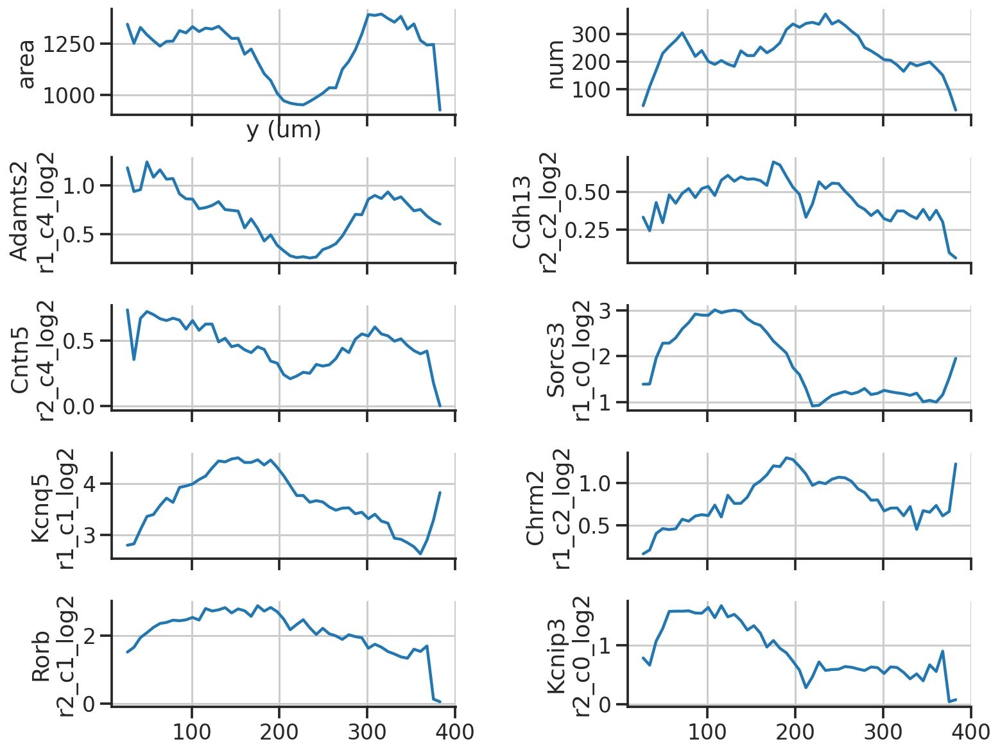

In [120]:
cols = np.hstack([
    ['area', 'num',],
    np.char.add(ftrs_order, '_log2'),
])
n = len(cols)
nx = 2
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny,nx,figsize=(6*nx,2*ny), sharex=True)
for i, (col, ax) in enumerate(zip(cols, axs.flat)):
    val = dfplot_binmean[col].values
    # val = val/np.nanmax(val)
    # print(val)
    ax.plot(bins[1:], val, label=col)
    ax.set_ylabel(col)
    if col.startswith('r'):
        ax.set_ylabel(gene_names[col.replace('_log2', '')] + "\n" + col)
    sns.despine(ax=ax)
    if i == 0:
        ax.set_xlabel('y (um)')
    
fig.subplots_adjust(wspace=0.5, hspace=0.4)
# ax.legend(bbox_to_anchor=(1,1))
plt.show()

#  test dropout

In [85]:
numexp = (dfnew[ftrs_cols] > 0).sum(axis=1) 
numexp

2        5
3        5
4        5
5        6
6        4
        ..
13753    5
13755    3
13756    3
13757    1
13758    2
Length: 12312, dtype: int64

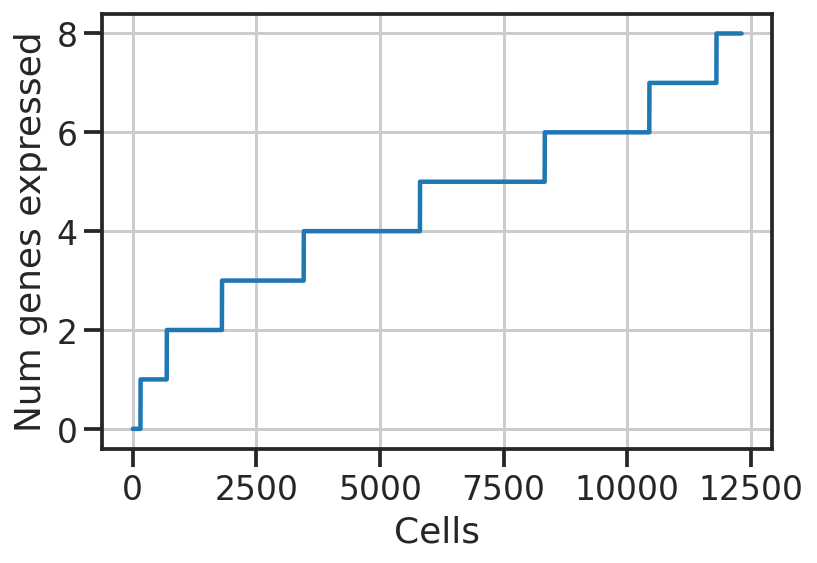

In [86]:
fig, ax = plt.subplots()
ax.plot(np.sort(numexp))
ax.set_ylabel('Num genes expressed')
ax.set_xlabel('Cells')
plt.show()

In [87]:
%%time
Zspace = umap.UMAP(n_components=2).fit_transform(dfnew[ftrs_cols].values)

CPU times: user 10min 55s, sys: 7.42 s, total: 11min 3s
Wall time: 16.9 s


In [88]:
Zspace

array([[ 3.3985326 , 11.844399  ],
       [-0.51556426, 10.4788065 ],
       [ 1.8958827 , 10.85241   ],
       ...,
       [ 9.893977  ,  7.645797  ],
       [11.588682  ,  8.0709    ],
       [18.30654   , 11.849421  ]], dtype=float32)

In [89]:
dfnew['umap_x'] = Zspace[:,0]
dfnew['umap_y'] = Zspace[:,1]

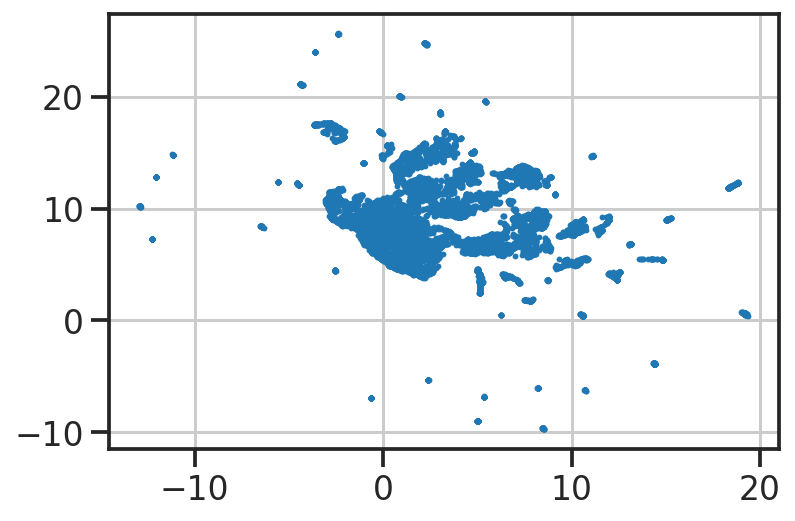

In [90]:
plt.scatter(Zspace[:,0], Zspace[:,1], s=2)

In [91]:
gene_names

{'r1_c0': 'Sorcs3',
 'r1_c1': 'Kcnq5',
 'r1_c2': 'Chrm2',
 'r1_c4': 'Adamts2',
 'r2_c0': 'Kcnip3',
 'r2_c1': 'Rorb',
 'r2_c2': 'Cdh13',
 'r2_c4': 'Cntn5'}

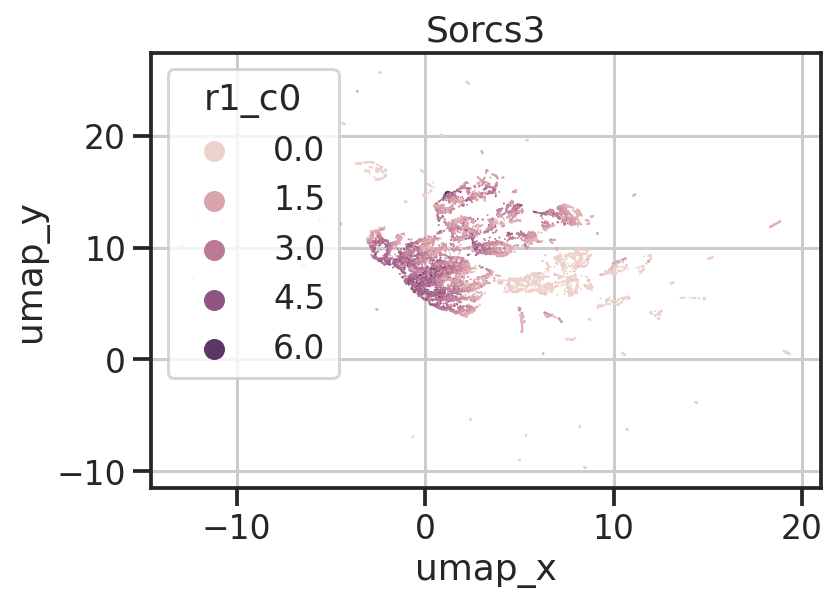

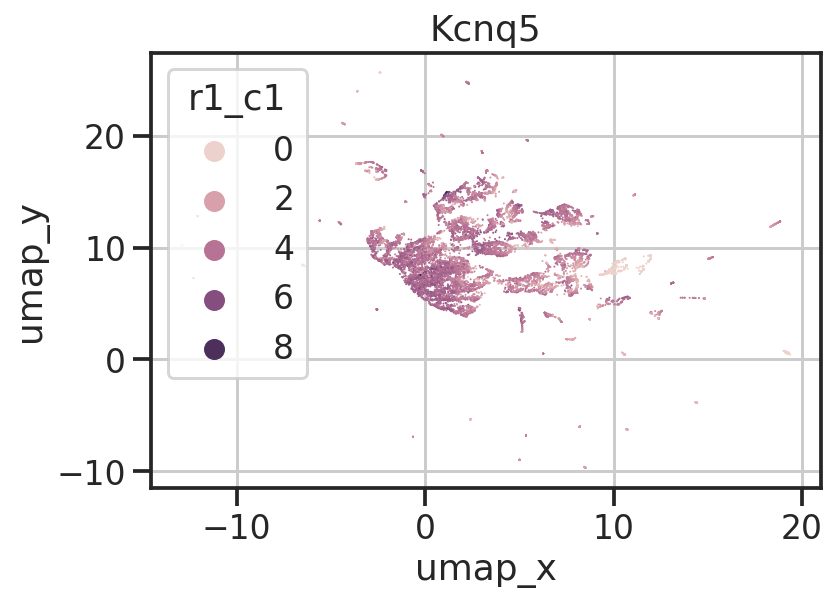

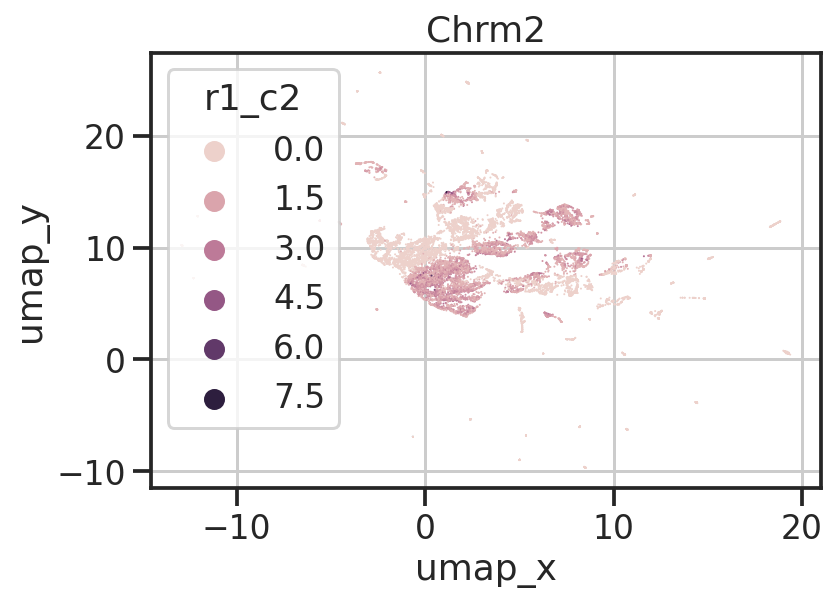

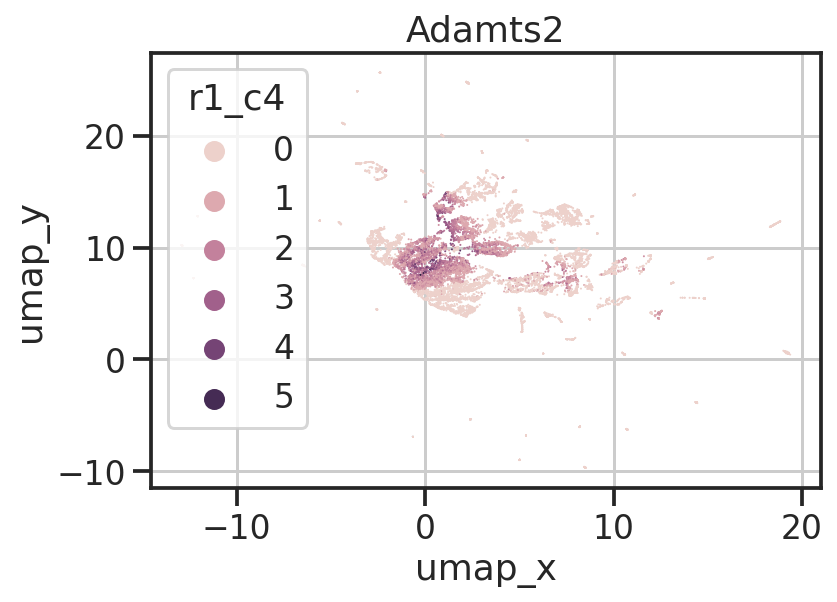

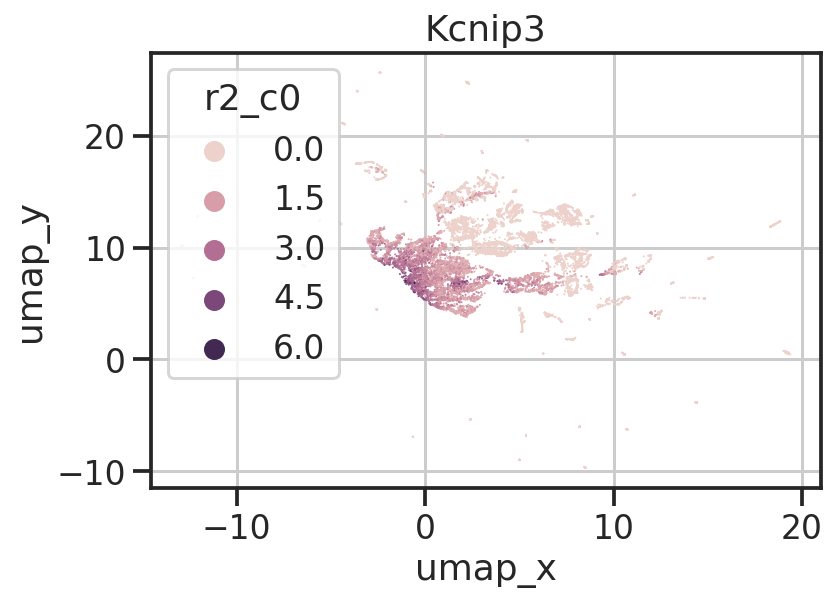

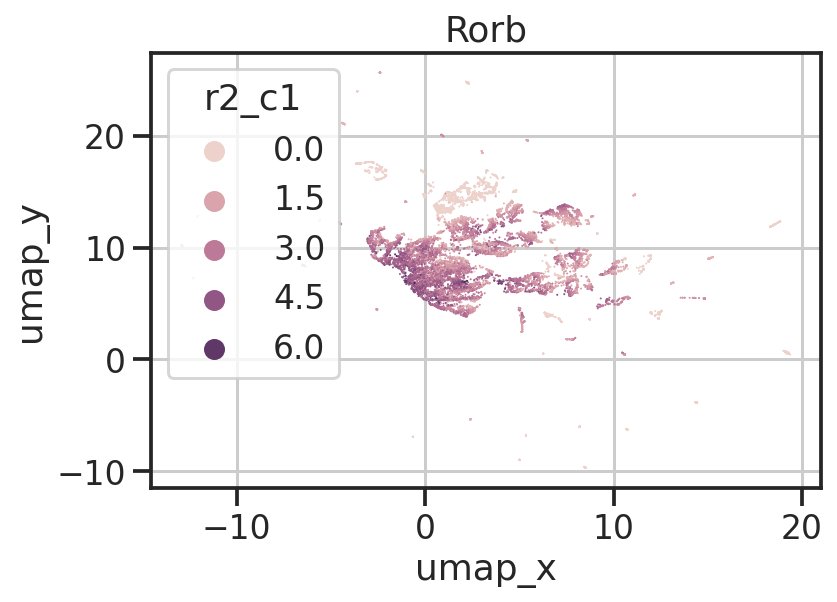

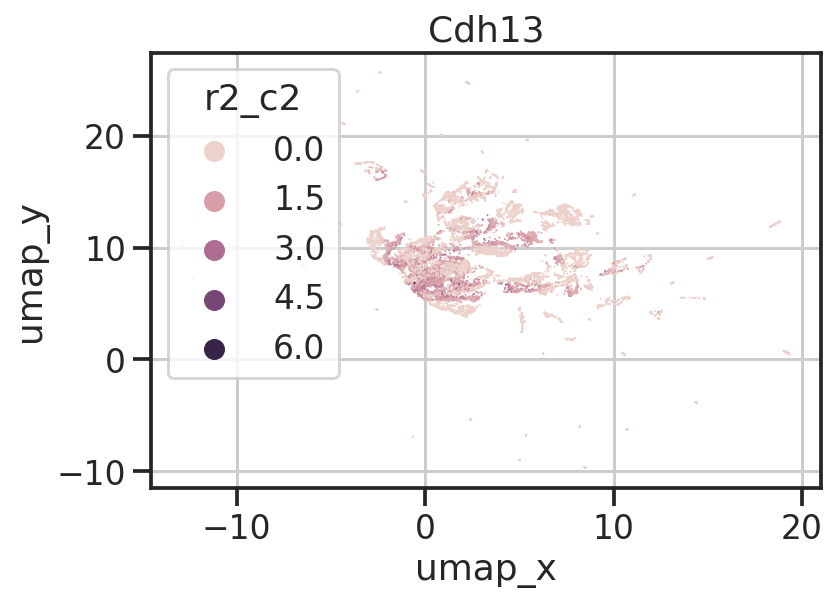

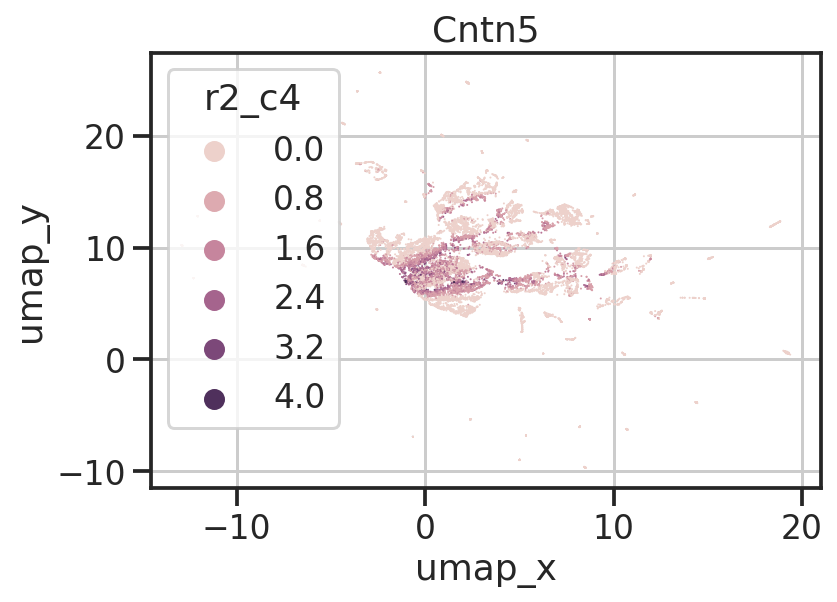

In [92]:
for col in ftrs_cols:
    fig, ax = plt.subplots()
    sns.scatterplot(data=dfnew, x='umap_x', y='umap_y', hue=col, s=1, edgecolor='none', cmap='coolwarm', ax=ax)
    ax.set_title(gene_names[col])
    plt.show()